In [1]:
from src.reader import PoseReader
from src.GlobalOpts import GlobalOpts
import os

opts = GlobalOpts(name='basemodel')
reader = PoseReader('train', opts)
reader_val = PoseReader('valid', opts)
batchX, batchY = reader.sample()

# Whether to train from scratch of reload from checkpoint
train = True

B, H, W, C = batchX.shape
_, M, D = batchY.shape
print B, H
print reader.num_batches

Generating train reader
[u'center', u'imgname', u'index', u'name', u'name_', u'normalize', u'part', u'person', u'scale', u'torsoangle', u'visible']
[ 3.77630772  3.09014563  7.05159556 ...,  4.04477441  1.86868938
  1.8243355 ]
Generating valid reader
[u'center', u'imgname', u'index', u'normalize', u'part', u'person', u'scale', u'torsoangle', u'visible']
[ 5.89810987  2.20229426  3.92404128 ...,  2.14830165  4.35        1.18793939]
32 224
695


In [2]:
%matplotlib inline
import numpy as np
import tensorflow as tf
from tensorflow.models.rnn.rnn_cell import BasicLSTMCell, MultiRNNCell
from tensorflow.python.ops.seq2seq import sequence_loss
import matplotlib.pyplot as plt

    
def conv2d(input_data, filter_size, stride, name):
    with tf.variable_scope(name):
        W = tf.get_variable("W", filter_size, initializer=tf.contrib.layers.xavier_initializer())
        return tf.nn.conv2d(input_data, W, [1, stride, stride, 1], "SAME")
        
def dense(input_data, input_size, hidden_size, name):
    with tf.variable_scope(name):
        W = tf.get_variable("W", [input_size, hidden_size], initializer=tf.contrib.layers.xavier_initializer())
        b = tf.get_variable("b", [hidden_size], initializer=tf.constant_initializer(0))
        return tf.matmul(input_data, W) + b

def batch_normalization(input_data, axes, name):
    with tf.variable_scope(name):
        mean, variance = tf.nn.moments(input_data, axes, keep_dims=True)
        return tf.nn.batch_normalization(input_data, mean, variance, None, None, 1e-5)
    
def conv2d_relu_batch_pool(input_data, filter_size, name, pool=True):
    c = conv2d(input_data, filter_size, 1, name + "_conv")
    r = tf.nn.relu(c)
    b = batch_normalization(r, [0, 1, 2], name + "_batch")
    return tf.nn.max_pool(b, [1, 2, 2, 1], [1, 2, 2, 1], "SAME") if pool else b

def lstm(state, input_data, num_steps, hidden_size, num_layers, name):
    # Input: (B, T, N)
    with tf.variable_scope(name) as scope:
        multi_lstm = MultiRNNCell([BasicLSTMCell(hidden_size)] * num_layers)
        outputs = []
        for t in range(num_steps):
            output, state = multi_lstm(input_data[:, t, :], state)
            output = batch_normalization(output, [0, 1], "batch")
            outputs.append(output)
            scope.reuse_variables()
        return outputs
        #return tf.transpose(tf.pack(outputs), perm=[1, 0, 2]) # (B, T, H)
    

In [3]:
print B, H, W, C
print M, D
tf.reset_default_graph()

sess = tf.Session()
    
input_data = tf.placeholder(tf.float32, shape=[B, H, W, C])
labels = tf.placeholder(tf.float32, shape=[B, M, D])

c1 = conv2d_relu_batch_pool(input_data, [3, 3, C, 64], "c1", pool=False)
c2 = conv2d_relu_batch_pool(c1, [3, 3, 64, 64], "c2", pool=True)

c3 = conv2d_relu_batch_pool(c2, [3, 3, 64, 128], "c3", pool=False)
c4 = conv2d_relu_batch_pool(c3, [3, 3, 128, 128], "c4", pool=True)

c5 = conv2d_relu_batch_pool(c4, [3, 3, 128, 256], "c5", pool=False)
c6 = conv2d_relu_batch_pool(c5, [3, 3, 256, 256], "c6", pool=False)
c7 = conv2d_relu_batch_pool(c6, [3, 3, 256, 256], "c7", pool=True)

c8 = conv2d_relu_batch_pool(c7, [3, 3, 256, 512], "c8", pool=False)
c9 = conv2d_relu_batch_pool(c8, [3, 3, 512, 512], "c9", pool=False)
c10 = conv2d_relu_batch_pool(c9, [3, 3, 512, 512], "c10", pool=True)

c11 = conv2d_relu_batch_pool(c10, [3, 3, 512, 512], "c11", pool=False)
c12 = conv2d_relu_batch_pool(c11, [3, 3, 512, 512], "c12", pool=False)
c13 = conv2d_relu_batch_pool(c12, [3, 3, 512, 512], "c13", pool=True)

lstm_input = tf.reshape(c13, [B, M, -1])
lstm_state = tf.reduce_mean(lstm_input, [1])
lstm_layer = lstm(lstm_state, lstm_input, M, 128, 6, "lstm")

logits = [dense(v, 128, 2, str(k) + "dense") for k, v in enumerate(lstm_layer)]
truth = [tf.squeeze(t) for t in tf.split(1, M, labels)]

loss = tf.add_n([tf.nn.l2_loss(t - l) for t, l in zip(truth, logits)]) / M
error = tf.add_n([tf.sqrt(tf.reduce_sum(tf.squared_difference(t, l))) for t,l in zip(truth,logits)]) / M

train_op = tf.train.AdamOptimizer(1e-3).minimize(loss)


saver = tf.train.Saver(tf.all_variables())
sess.run(tf.initialize_all_variables())

if train:
    output, mse = 0, 0
    val_output, val_mse = 0, 0
    history = []
    history_mse = []
    val_history = []
    val_history_mse = []
    for it in range(10000):
        print it, output, mse, val_output, val_mse,
        batchX, batchY = reader.sample()

        output, mse, _ = sess.run([loss, error, train_op], feed_dict={
            input_data: batchX,
                labels: batchY
        })
        history.append(output)
        history_mse.append(mse)

        batchX, batchY = reader_val.sample()
        val_output, val_mse = sess.run([loss, error], feed_dict={
            input_data: batchX,
            labels: batchY
        })
        val_history.append(val_output)
        val_history_mse.append(val_mse)
        print '\r',

        if it % 1000 == 0:
            print 'Iteration : %d MSE : %f' % (it, val_mse)

    if not os.path.exists(opts.ARCHLOG_DIR):
        os.makedirs(opts.ARCHLOG_DIR)
    checkpoint_path = os.path.join(opts.ARCHLOG_DIR, 'checkpoint.ckpt')
    saver.save(sess, checkpoint_path, global_step=it)

else:
    all_ckpts = tf.train.get_checkpoint_state(opts.ARCHLOG_DIR)
    saver.restore(sess, all_ckpts.model_checkpoint_path)

    

32 224 224 3
16 2
Iteration : 0 MSE : 859.693481
Iteration : 1000 MSE : 403.330750
Iteration : 2000 MSE : 396.583740
Iteration : 3000 MSE : 361.266937
Iteration : 4000 MSE : 391.419556
Iteration : 5000 MSE : 446.722443
Iteration : 6000 MSE : 377.386780
Iteration : 7000 MSE : 355.556885
Iteration : 8000 MSE : 357.252594
Iteration : 9000 MSE : 382.724670


In [4]:
print history_mse[-20:]
print val_history_mse[-20:]

[408.16431, 375.92584, 365.862, 357.67447, 381.40979, 322.40265, 377.13428, 417.31335, 407.28183, 387.24774, 385.50296, 405.80634, 355.03052, 391.448, 347.19916, 420.7348, 385.37057, 348.65601, 372.67542, 439.452]
[351.31387, 358.65002, 415.7486, 409.46692, 381.3645, 389.20734, 402.91141, 359.76025, 385.91809, 377.55942, 370.19336, 381.29193, 388.83362, 372.01242, 376.61826, 427.39432, 397.68634, 394.02228, 371.20728, 318.24823]


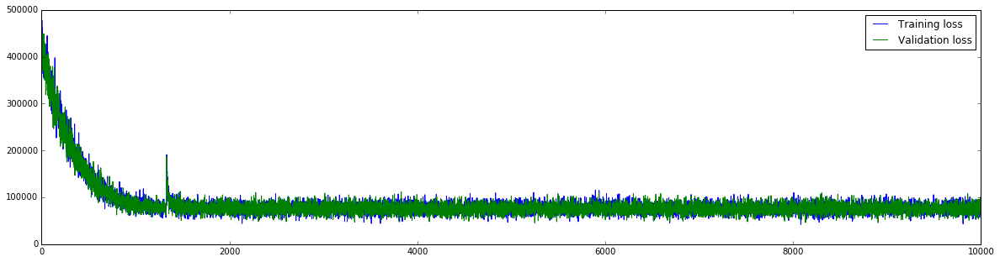

In [5]:
plt.figure(figsize=(20, 5))
plt.plot(np.arange(len(history)), history)
plt.plot(np.arange(len(val_history)), val_history)
plt.legend(["Training loss", "Validation loss"])

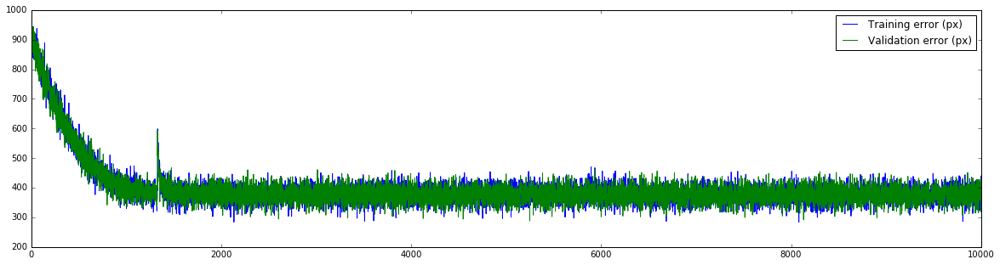

In [6]:
plt.figure(figsize=(20, 5))
plt.plot(np.arange(len(history_mse)), history_mse)
plt.plot(np.arange(len(val_history_mse)), val_history_mse)
plt.legend(["Training error (px)", "Validation error (px)"])

In [7]:
batchX, batchY = reader_val.sample()
pred = sess.run(logits, feed_dict={input_data: batchX, labels: batchY})

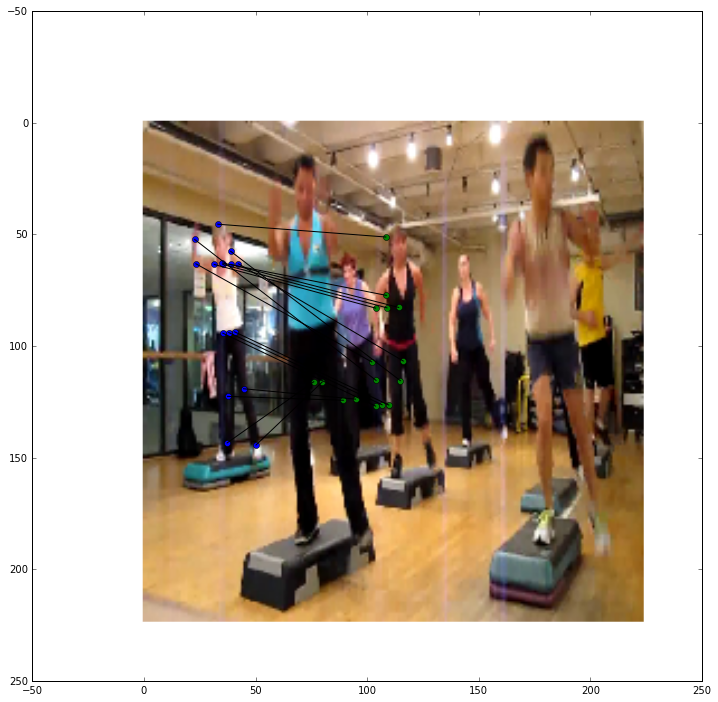

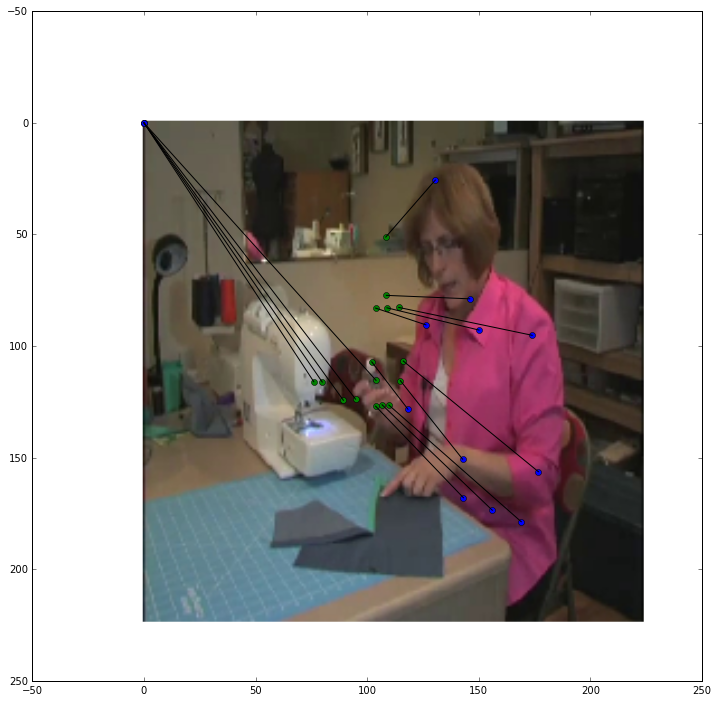

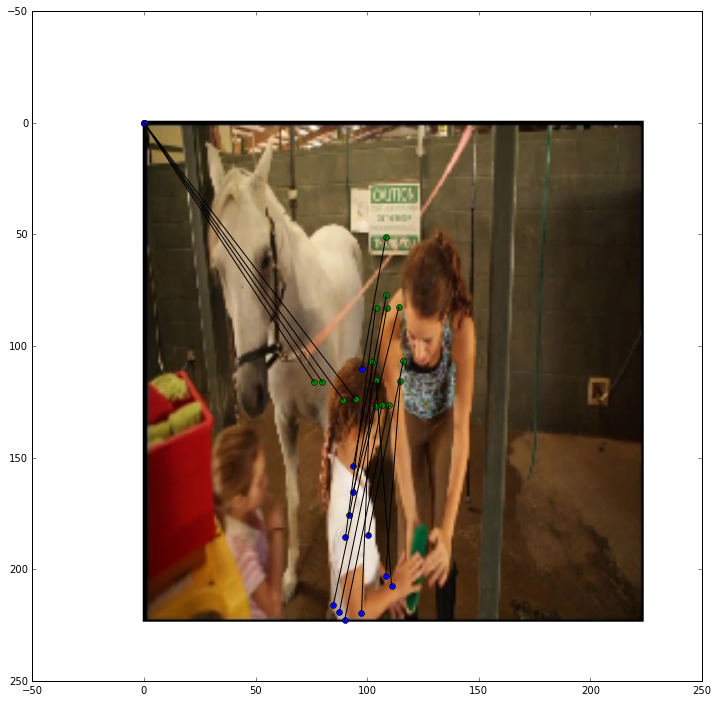

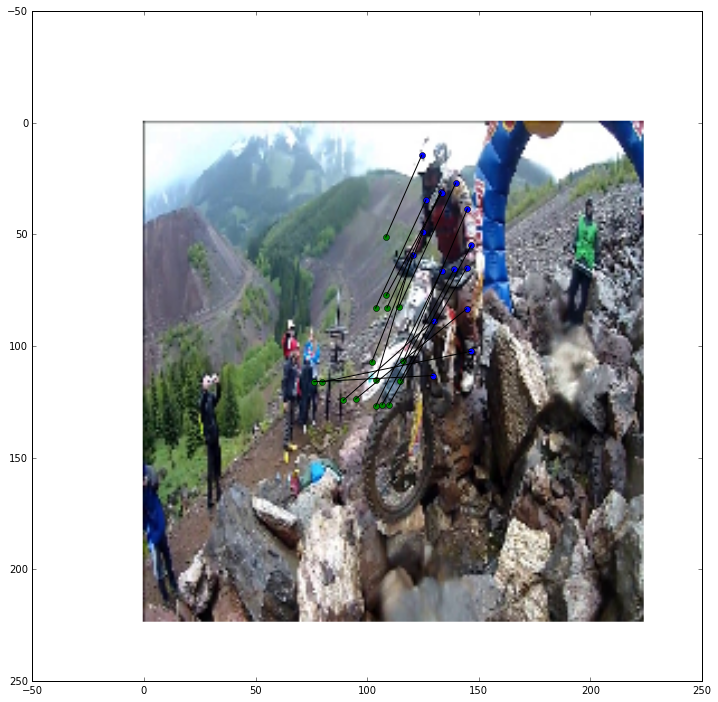

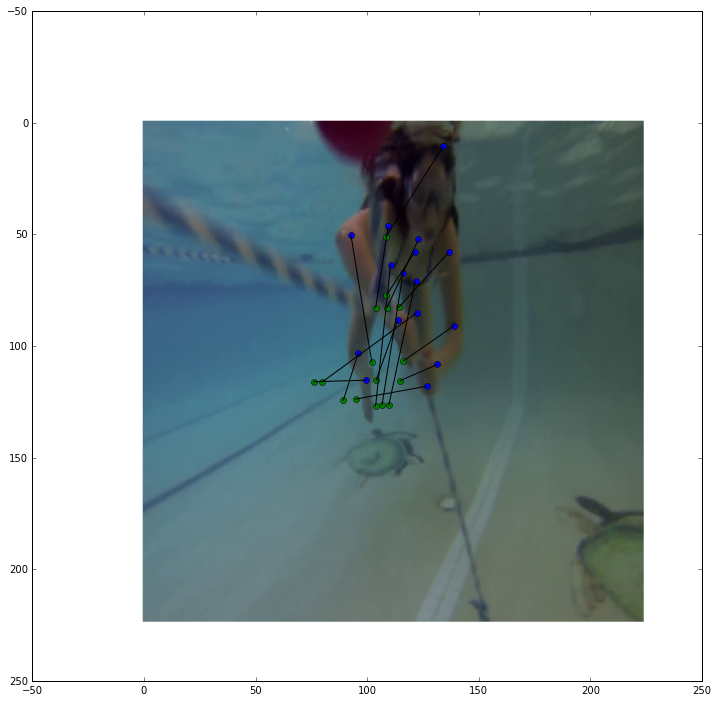

...

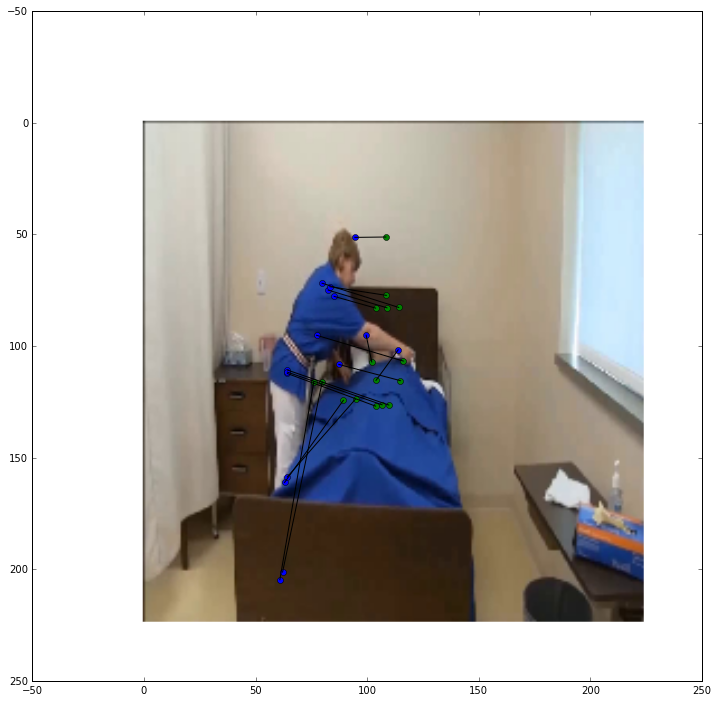

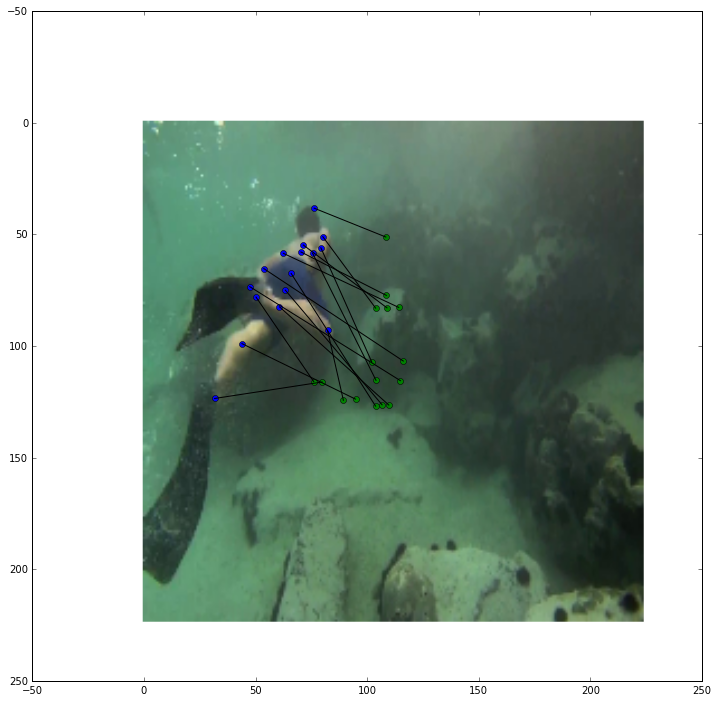

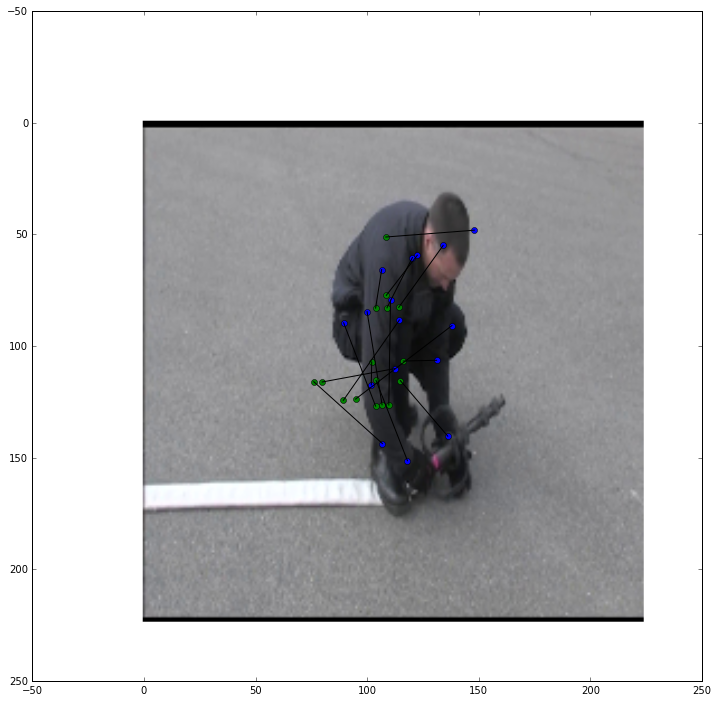

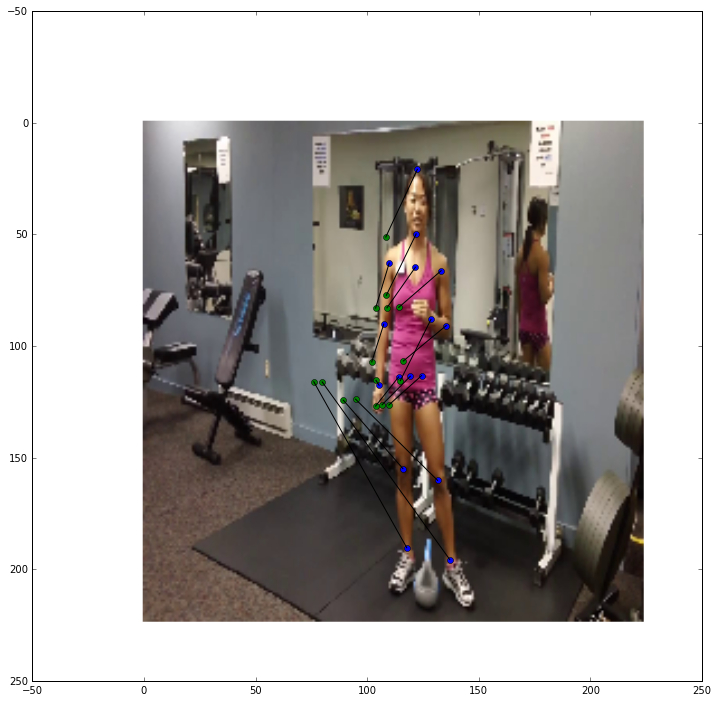

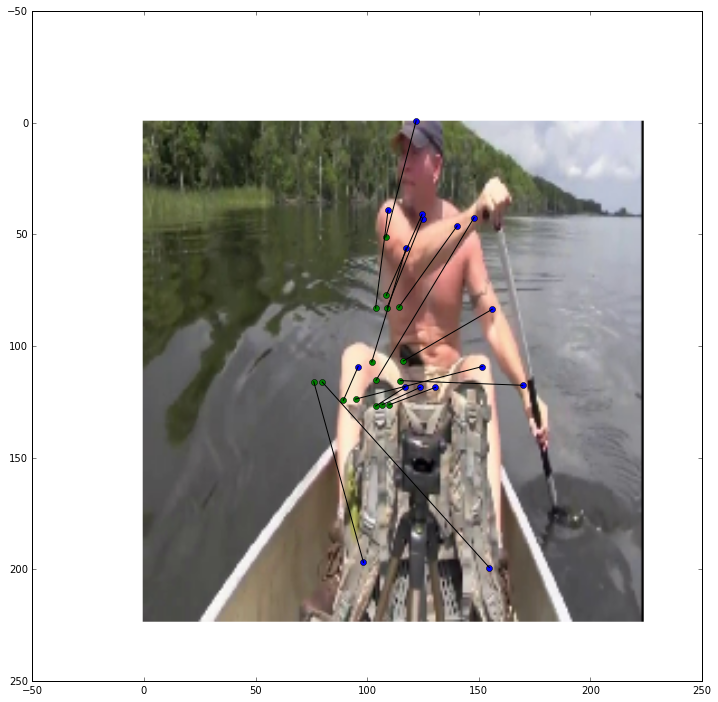

In [8]:
for ind in range(batchX.shape[0]):
    img = batchX[ind,::]
    label = batchY[ind,::]
    jpred = np.array([pred[i][ind,:] for i in range(16)])
    
    plt.figure(num=None, figsize=(16, 12), dpi=80, facecolor='w', edgecolor='k')
    plt.imshow(img)
    plt.plot(label[:,0], label[:,1], "o")
    plt.plot(jpred[:,0], jpred[:,1], "o")

    # Plot line between labels and pred
    for i in range(label.shape[0]):
        plt.plot([label[i,0], jpred[i,0]],[label[i,1], jpred[i,1]], 'k-')
    plt.show()